In [4]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [5]:
# Structring the data in tablular format
import pandas as pd 
# For mathmetical calculation
import numpy as np 
# For visual representatino of data
import matplotlib.pyplot as plt 
import plotly as plot
import plotly.express as px
import seaborn as sns
from wordcloud import WordCloud, STOPWORDS
# For extracting the zip data 
import gzip
import shutil
import json
# For building and training machine learning models
from sklearn.feature_extraction.text import TfidfVectorizer,CountVectorizer
from sklearn.model_selection import train_test_split
from sklearn.naive_bayes import MultinomialNB,BernoulliNB
from sklearn.metrics import classification_report,confusion_matrix,roc_curve,auc
from sklearn import metrics
from nltk.corpus import stopwords
from nltk.tokenize import word_tokenize
from nltk.tokenize import sent_tokenize
from nltk.tokenize import regexp_tokenize
import nltk
nltk.download('punkt')
nltk.download('stopwords')

[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


True

In [6]:
# Extracting path 
path1 = '/content/drive/My Drive/sentiment_analysis/meta_Cell_Phones_and_Accessories.json.gz'
path2 = '/content/drive/My Drive/sentiment_analysis/meta_Cell_Phones_and_Accessories.json'

In [7]:
# Extracting data from files
with gzip.open(path1, 'rb') as f_in:
    with open(path2, 'wb') as f_out:
        shutil.copyfileobj(f_in, f_out)


In [8]:
# Reading data from files
phonemetadata = []
with open(path2, 'r') as f:
    for line in f:
        phonemetadata.append(json.loads(line))

In [9]:
# Creating DataFrame from data
df_meta=pd.DataFrame(phonemetadata)
df_phonedata = pd.read_csv('/content/drive/My Drive/sentiment_analysis/Cell_Phones_and_Accessories_5.csv')
df_phonedata.head()

/usr/local/lib/python3.7/dist-packages/IPython/core/interactiveshell.py:2882: DtypeWarning: Columns (9) have mixed types.Specify dtype option on import or set low_memory=False.
  exec(code_obj, self.user_global_ns, self.user_ns)


,overall,verified,reviewerID,asin,style,reviewerName,reviewText,summary,unixReviewTime,vote,image,review_sentiment
0,5.0,True,A24E3SXTC62LJI,7508492919,{'Color:': ' Bling'},Claudia Valdivia,Looks even better in person. Be careful to not...,Can't stop won't stop looking at it,1407110400,NaN,NaN,POSITIVE
1,5.0,True,A269FLZCB4GIPV,7508492919,NaN,sarah ponce,When you don't want to spend a whole lot of ca...,1,1392163200,NaN,NaN,POSITIVE
2,3.0,True,AB6CHQWHZW4TV,7508492919,NaN,Kai,"so the case came on time, i love the design. I...",Its okay,1391817600,NaN,NaN,NEGATIVE
3,2.0,True,A1M117A53LEI8,7508492919,NaN,Sharon Williams,DON'T CARE FOR IT. GAVE IT AS A GIFT AND THEY...,CASE,1391472000,NaN,NaN,POSITIVE
4,4.0,True,A272DUT8M88ZS8,7508492919,NaN,Bella Rodriguez,"I liked it because it was cute, but the studs ...",Cute!,1391385600,NaN,NaN,POSITIVE


In [10]:
# Converting timestapm to human readable format
from datetime import datetime, timedelta
df_phonedata['Date&Time'] = df_phonedata['unixReviewTime'].apply(lambda d: (datetime.fromtimestamp(d) - timedelta(hours=2)).strftime('%Y-%m-%d'))

In [11]:
# Checking the information about the data
df_phonedata.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1128437 entries, 0 to 1128436
Data columns (total 13 columns):
 #   Column            Non-Null Count    Dtype  
---  ------            --------------    -----  
 0   overall           1128437 non-null  float64
 1   verified          1128437 non-null  bool   
 2   reviewerID        1128437 non-null  object 
 3   asin              1128437 non-null  object 
 4   style             605241 non-null   object 
 5   reviewerName      1128281 non-null  object 
 6   reviewText        1127669 non-null  object 
 7   summary           1127912 non-null  object 
 8   unixReviewTime    1128437 non-null  int64  
 9   vote              92034 non-null    object 
 10  image             27107 non-null    object 
 11  review_sentiment  1128437 non-null  object 
 12  Date&Time         1128437 non-null  object 
dtypes: bool(1), float64(1), int64(1), object(10)
memory usage: 104.4+ MB


In [12]:
# Checking the null value percentage
df_phonedata.isna().sum()/len(df_phonedata)*100

overall              0.000000
verified             0.000000
reviewerID           0.000000
asin                 0.000000
style               46.364662
reviewerName         0.013824
reviewText           0.068059
summary              0.046525
unixReviewTime       0.000000
vote                91.844117
image               97.597828
review_sentiment     0.000000
Date&Time            0.000000
dtype: float64

In [13]:
# Removing unneccessary columns
df_phonedata.drop(['unixReviewTime','vote','image','style','reviewerID','summary'],axis=1,inplace=True)

In [14]:
# Changing datatype of "review_sentiment" to integer for model building
df_phonedata['review_sentiment'] = df_phonedata['review_sentiment'].map({'POSITIVE':1,'NEGATIVE':0})

In [15]:
# Removing null rows from "reviewText" column
phonedata = df_phonedata[~(df_phonedata['reviewText'].isna())]
phonedata.head()

,overall,verified,asin,reviewerName,reviewText,review_sentiment,Date&Time
0,5.0,True,7508492919,Claudia Valdivia,Looks even better in person. Be careful to not...,1,2014-08-03
1,5.0,True,7508492919,sarah ponce,When you don't want to spend a whole lot of ca...,1,2014-02-11
2,3.0,True,7508492919,Kai,"so the case came on time, i love the design. I...",0,2014-02-07
3,2.0,True,7508492919,Sharon Williams,DON'T CARE FOR IT. GAVE IT AS A GIFT AND THEY...,1,2014-02-03
4,4.0,True,7508492919,Bella Rodriguez,"I liked it because it was cute, but the studs ...",1,2014-02-02


In [16]:
# Reading the stop_words_long.txt 
with open("/content/drive/MyDrive/sentiment_analysis/stop_words_long.txt") as s:
    stop_words = [text.replace('\n','') for text in s]
    
# Reading the stop_words_long.txt 
with open("/content/drive/MyDrive/sentiment_analysis/neg_words.txt") as s:
    neg_words = [text.replace('\n','') for text in s]
print(len(neg_words))

# Reading the stop_words_long.txt 
with open("/content/drive/MyDrive/sentiment_analysis/pos_words.txt") as s:
    pos_words = [text.replace('\n','') for text in s]
print(len(pos_words))

4804
2006


In [17]:
# Creating helper functions 
def clean_Text(text):    
    text = text.lower()
    pattern = '[\w]+'
    text = regexp_tokenize(text,pattern)
    no_stops = [word for word in text if word not in stop_words]
    
    return no_stops

In [18]:
#Creating the new column 'No_Stop_Words' in df_phonedata DataFrame to store the non-stopwords list
phonedata['No_Stop_Words'] = phonedata['reviewText'].apply(clean_Text)
phonedata.head()

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  


,overall,verified,asin,reviewerName,reviewText,review_sentiment,Date&Time,No_Stop_Words
0,5.0,True,7508492919,Claudia Valdivia,Looks even better in person. Be careful to not...,1,2014-08-03,"[looks, better, person, careful, not, drop, ph..."
1,5.0,True,7508492919,sarah ponce,When you don't want to spend a whole lot of ca...,1,2014-02-11,"[don, spend, lot, cash, great, deal, shop, buy]"
2,3.0,True,7508492919,Kai,"so the case came on time, i love the design. I...",0,2014-02-07,"[time, love, design, actually, missing, 2, stu..."
3,2.0,True,7508492919,Sharon Williams,DON'T CARE FOR IT. GAVE IT AS A GIFT AND THEY...,1,2014-02-03,"[don, care, gift, okay, not, expected]"
4,4.0,True,7508492919,Bella Rodriguez,"I liked it because it was cute, but the studs ...",1,2014-02-02,"[liked, cute, studs, fall, easily, protect, ph..."


In [19]:
# Now let's clean the metadata file
df_meta.head()

,category,tech1,description,fit,title,also_buy,image,tech2,brand,feature,rank,also_view,details,main_cat,similar_item,date,price,asin
0,"[Cell Phones & Accessories, Accessories, Scree...",,[],,Trollies Sing a Long Party VHS,[],[],,,[],"557,379 in Movies & TV (",[],{'ASIN: ': '6303195164'},Movies & TV,,,,6303195164
1,"[Cell Phones & Accessories, Accessories, Car A...",,[],,La Pura VHS,[],[],,Maribel Guardia,[],"1,024,449 in Movies & TV (",[],{'ASIN: ': '630524412X'},Movies & TV,,,,630524412X
2,"[Cell Phones & Accessories, Cases, Holsters & ...",,"[New items to give you a new good mood, welcom...",,Leopard Thanksgiving Easter PC Black Case for ...,[],[],,,[],"5,315,017 in Books (",[],"{'Publisher:': 'juduiou', 'ASIN:': '6310200240...",Books,,,,6310200240
3,"[Cell Phones & Accessories, Cases, Holsters & ...",,"[A brand-new, unused, unopened, undamaged item...",,Puppies Faceplate Hard Case Protector for Net1...,[],[],,Live2Pedal,[Protect your phone with style through this At...,"[>#6,368,825 in Cell Phones & Accessories (See...",[],{},Cell Phones & Accessories,,,,6786501710
4,"[Cell Phones & Accessories, Cases, Holsters & ...",,"[A brand-new, unused, unopened, undamaged item...",,White Wolf Faceplate Protector Hard Case for S...,[],[],,wirelessoutletusa,[Protect your phone with style through this At...,"[>#2,672,454 in Cell Phones & Accessories (See...",[],{},Cell Phones & Accessories,,,,6786501273


In [20]:
# Checking the information about the data
df_meta.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 590071 entries, 0 to 590070
Data columns (total 18 columns):
 #   Column        Non-Null Count   Dtype 
---  ------        --------------   ----- 
 0   category      590071 non-null  object
 1   tech1         590071 non-null  object
 2   description   590071 non-null  object
 3   fit           590071 non-null  object
 4   title         590071 non-null  object
 5   also_buy      590071 non-null  object
 6   image         590071 non-null  object
 7   tech2         590071 non-null  object
 8   brand         590071 non-null  object
 9   feature       590071 non-null  object
 10  rank          590071 non-null  object
 11  also_view     590071 non-null  object
 12  details       590071 non-null  object
 13  main_cat      590071 non-null  object
 14  similar_item  590071 non-null  object
 15  date          590071 non-null  object
 16  price         590071 non-null  object
 17  asin          590071 non-null  object
dtypes: object(18)
memory usa

In [21]:
# Taking neccessary columns
df_meta = df_meta[['category','also_buy','also_view','brand','asin']]
df_meta.head()

,category,also_buy,also_view,brand,asin
0,"[Cell Phones & Accessories, Accessories, Scree...",[],[],,6303195164
1,"[Cell Phones & Accessories, Accessories, Car A...",[],[],Maribel Guardia,630524412X
2,"[Cell Phones & Accessories, Cases, Holsters & ...",[],[],,6310200240
3,"[Cell Phones & Accessories, Cases, Holsters & ...",[],[],Live2Pedal,6786501710
4,"[Cell Phones & Accessories, Cases, Holsters & ...",[],[],wirelessoutletusa,6786501273


In [22]:
#Checking for duplicate values
df_meta[(df_meta['asin'].duplicated())].head()

,category,also_buy,also_view,brand,asin
1848,"[Cell Phones & Accessories, Cases, Holsters & ...",[],[],Palm,B00000J3Q2
1849,"[Cell Phones & Accessories, Cases, Holsters & ...",[],[],Palm,B00000J438
1850,"[Cell Phones & Accessories, Accessories, Cables]",[],[],Palm,B00000JHVQ
1851,"[Cell Phones & Accessories, Accessories, Scree...","[B07C6BSHKL, B077HRTNLM, B075WPCSHK, B07CL119K...","[B07CXN96BT, B077HRTNLM, B07GYL7PCR, B07LGNS6R...",Live2Pedal,B00001O39C
1852,"[Cell Phones & Accessories, Accessories]",[],[],Ear Hugger,B00001OPI3


In [23]:
#Removing the duplicate values from the DataFrame
df_meta = df_meta[~(df_meta['asin'].duplicated())]

In [24]:
# Taking only Cell Phones related data
df_meta = df_meta[df_meta.category.apply(lambda x: x[1] == 'Cell Phones' if len(x) >= 2 else False)]
df_meta.shape

(9789, 5)

In [25]:
# Filtering the data based on same asin ID
phonedata = phonedata[phonedata.asin.isin(df_meta.asin)]
phonedata.head()

,overall,verified,asin,reviewerName,reviewText,review_sentiment,Date&Time,No_Stop_Words
654,1.0,False,B0000E3GWH,Old-and-Wise,This phone is ugly and heavy and has a terribl...,0,2004-09-20,"[phone, ugly, heavy, terrible, user, interface..."
655,4.0,False,B0000E3GWH,Sherry Berry,I had the Samsung V205 and then I decided to t...,1,2004-07-23,"[samsung, v205, decided, try, e715, fyi, peopl..."
656,3.0,False,B0000E3GWH,Benjamin David,This is the first Samsung phone I have had and...,0,2004-07-05,"[samsung, phone, not, measure, v300, am, tmobi..."
657,5.0,True,B0000E3GWH,James Beswick,"..and I'm from Europe, where the phones and ne...",1,2004-04-11,"[europe, phones, networks, better, samsung, cu..."
658,3.0,False,B0000E3GWH,Kepela,This phone is amazingly small and light for a ...,1,2004-02-18,"[phone, amazingly, light, camera, phone, flash..."


In [26]:
# Now we are merging the both DataFrame phonedata and phonemetadata
processed_Data = pd.merge(phonedata,df_meta,left_on=['asin'],right_on=['asin'],how = "left")
processed_Data.head() 

,overall,verified,asin,reviewerName,reviewText,review_sentiment,Date&Time,No_Stop_Words,category,also_buy,also_view,brand
0,1.0,False,B0000E3GWH,Old-and-Wise,This phone is ugly and heavy and has a terribl...,0,2004-09-20,"[phone, ugly, heavy, terrible, user, interface...","[Cell Phones & Accessories, Cell Phones, Carri...",[],[],Samsung
1,4.0,False,B0000E3GWH,Sherry Berry,I had the Samsung V205 and then I decided to t...,1,2004-07-23,"[samsung, v205, decided, try, e715, fyi, peopl...","[Cell Phones & Accessories, Cell Phones, Carri...",[],[],Samsung
2,3.0,False,B0000E3GWH,Benjamin David,This is the first Samsung phone I have had and...,0,2004-07-05,"[samsung, phone, not, measure, v300, am, tmobi...","[Cell Phones & Accessories, Cell Phones, Carri...",[],[],Samsung
3,5.0,True,B0000E3GWH,James Beswick,"..and I'm from Europe, where the phones and ne...",1,2004-04-11,"[europe, phones, networks, better, samsung, cu...","[Cell Phones & Accessories, Cell Phones, Carri...",[],[],Samsung
4,3.0,False,B0000E3GWH,Kepela,This phone is amazingly small and light for a ...,1,2004-02-18,"[phone, amazingly, light, camera, phone, flash...","[Cell Phones & Accessories, Cell Phones, Carri...",[],[],Samsung


# DATA VISUALIZATION

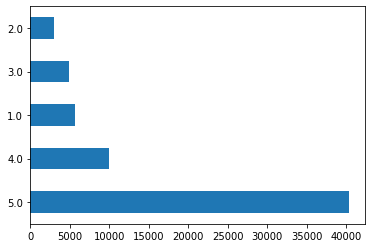

In [27]:
# Plotting the count of rating
processed_Data.overall.value_counts().plot(kind="barh")

In [28]:
# Filtering the Top 5 brands from data
Top_5 = processed_Data[processed_Data.brand.isin((processed_Data.brand.value_counts() >= 4885).index[:5]) ] 
Top_5.head()

,overall,verified,asin,reviewerName,reviewText,review_sentiment,Date&Time,No_Stop_Words,category,also_buy,also_view,brand
0,1.0,False,B0000E3GWH,Old-and-Wise,This phone is ugly and heavy and has a terribl...,0,2004-09-20,"[phone, ugly, heavy, terrible, user, interface...","[Cell Phones & Accessories, Cell Phones, Carri...",[],[],Samsung
1,4.0,False,B0000E3GWH,Sherry Berry,I had the Samsung V205 and then I decided to t...,1,2004-07-23,"[samsung, v205, decided, try, e715, fyi, peopl...","[Cell Phones & Accessories, Cell Phones, Carri...",[],[],Samsung
2,3.0,False,B0000E3GWH,Benjamin David,This is the first Samsung phone I have had and...,0,2004-07-05,"[samsung, phone, not, measure, v300, am, tmobi...","[Cell Phones & Accessories, Cell Phones, Carri...",[],[],Samsung
3,5.0,True,B0000E3GWH,James Beswick,"..and I'm from Europe, where the phones and ne...",1,2004-04-11,"[europe, phones, networks, better, samsung, cu...","[Cell Phones & Accessories, Cell Phones, Carri...",[],[],Samsung
4,3.0,False,B0000E3GWH,Kepela,This phone is amazingly small and light for a ...,1,2004-02-18,"[phone, amazingly, light, camera, phone, flash...","[Cell Phones & Accessories, Cell Phones, Carri...",[],[],Samsung


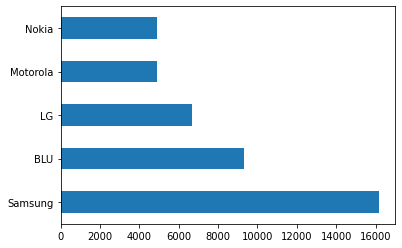

In [29]:
# Plotting the number of reviews by brand name 
Top_5.brand.value_counts().plot(kind='barh')
plt.show()

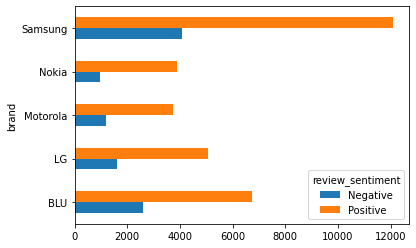

In [30]:
# Plotting number of "POSITIVE" and "NEGATIVE" sentiments by brand name
temp = Top_5.pivot_table(index= "review_sentiment",columns='brand',aggfunc="count")
x = temp['reviewText'].T
x = x.rename(columns={0:'Negative',1:'Positive'})
x.plot(kind='barh')
plt.show()

# Text analytics

In [31]:
# Helper functions for Text analytics

def Pos_Words(text):
  text = text.lower()
  pattern = '[\w]+'
  text = regexp_tokenize(text,pattern)
  no_pos_words = [word for word in text if word not in stop_words and word not in pos_words]    
  return no_pos_words


def Neg_Words(text):
  text = text.lower()
  pattern = '[\w]+'
  text = regexp_tokenize(text,pattern)
  no_neg_words = [word for word in text if word not in stop_words and  word not in neg_words]    
  return no_neg_words

In [32]:
# Creating new columns 'Positive_Words' and 'Negative_Words'
processed_Data['Positive_Words'] = processed_Data.reviewText.apply(Pos_Words)
processed_Data['Negative_Words'] = processed_Data.reviewText.apply(Neg_Words)
processed_Data.head()

,overall,verified,asin,reviewerName,reviewText,review_sentiment,Date&Time,No_Stop_Words,category,also_buy,also_view,brand,Positive_Words,Negative_Words
0,1.0,False,B0000E3GWH,Old-and-Wise,This phone is ugly and heavy and has a terribl...,0,2004-09-20,"[phone, ugly, heavy, terrible, user, interface...","[Cell Phones & Accessories, Cell Phones, Carri...",[],[],Samsung,"[phone, ugly, heavy, terrible, user, interface...","[phone, heavy, user, interface, techies, like,..."
1,4.0,False,B0000E3GWH,Sherry Berry,I had the Samsung V205 and then I decided to t...,1,2004-07-23,"[samsung, v205, decided, try, e715, fyi, peopl...","[Cell Phones & Accessories, Cell Phones, Carri...",[],[],Samsung,"[samsung, v205, decided, try, e715, fyi, peopl...","[samsung, v205, decided, try, e715, fyi, peopl..."
2,3.0,False,B0000E3GWH,Benjamin David,This is the first Samsung phone I have had and...,0,2004-07-05,"[samsung, phone, not, measure, v300, am, tmobi...","[Cell Phones & Accessories, Cell Phones, Carri...",[],[],Samsung,"[samsung, phone, not, measure, v300, am, tmobi...","[samsung, phone, measure, v300, am, tmobile, c..."
3,5.0,True,B0000E3GWH,James Beswick,"..and I'm from Europe, where the phones and ne...",1,2004-04-11,"[europe, phones, networks, better, samsung, cu...","[Cell Phones & Accessories, Cell Phones, Carri...",[],[],Samsung,"[europe, phones, networks, samsung, currently,...","[europe, phones, networks, better, samsung, cu..."
4,3.0,False,B0000E3GWH,Kepela,This phone is amazingly small and light for a ...,1,2004-02-18,"[phone, amazingly, light, camera, phone, flash...","[Cell Phones & Accessories, Cell Phones, Carri...",[],[],Samsung,"[phone, light, camera, phone, flashlight, flas...","[phone, amazingly, light, camera, phone, flash..."


In [33]:
words = processed_Data['No_Stop_Words'].apply(lambda x: " ".join(x))
positive = processed_Data['Positive_Words'].apply(lambda x: " ".join(x))
negetive = processed_Data['Negative_Words'].apply(lambda x: " ".join(x))

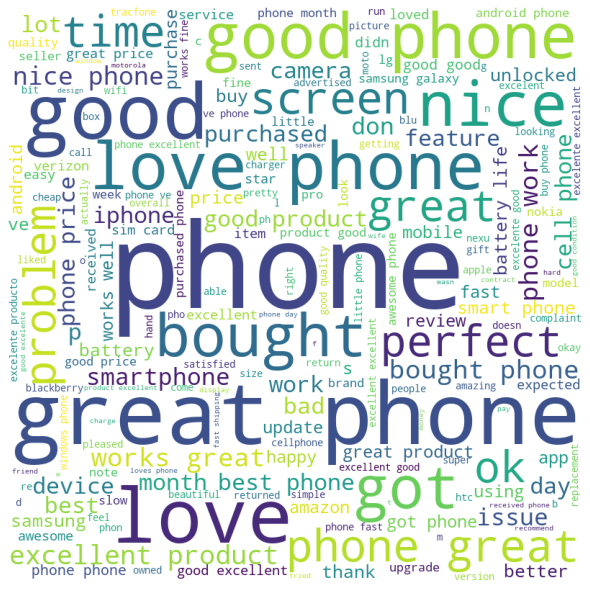

In [34]:
# Plotting wordCloud 
wordcloud = WordCloud(width = 800, height = 800,
                background_color ='white',               
                min_font_size = 10).generate(words.to_string())

plt.figure(figsize = (8, 8), facecolor = None)
plt.imshow(wordcloud)
plt.axis("off")
plt.tight_layout(pad = 0)
 
plt.show()

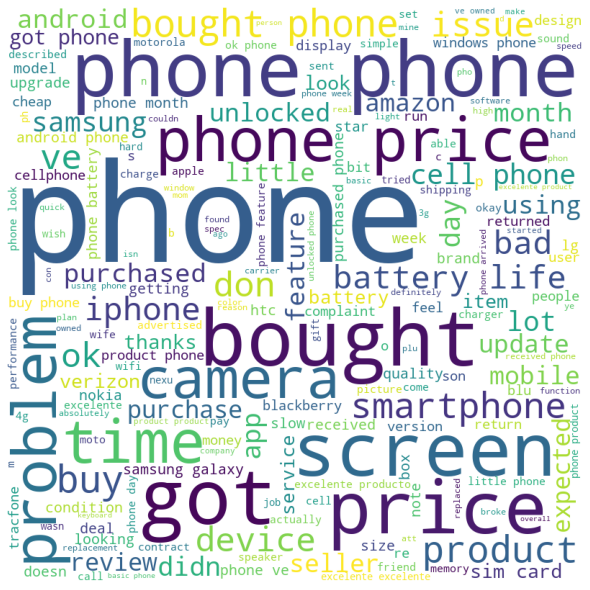

In [35]:
# Plotting wordCloud for positive word reviews
wordcloud = WordCloud(width = 800, height = 800,
                background_color ='white',               
                min_font_size = 10).generate(positive.to_string())

plt.figure(figsize = (8, 8), facecolor = None)
plt.imshow(wordcloud)
plt.axis("off")
plt.tight_layout(pad = 0)
 
plt.show()

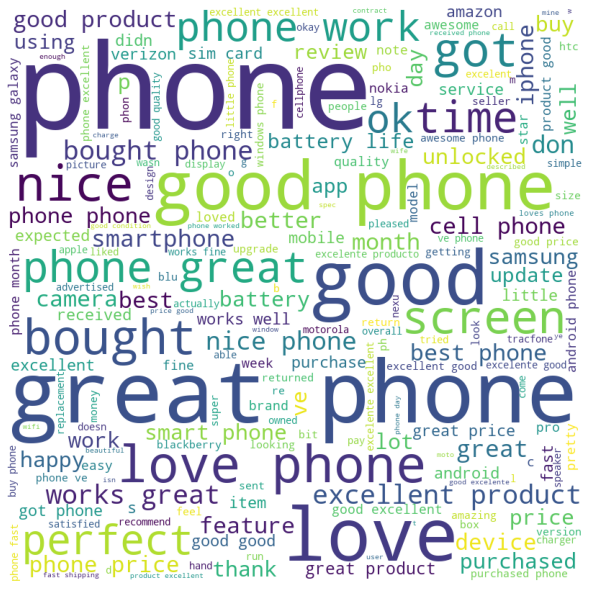

In [36]:
# Plotting wordCloud for negative word reviews
wordcloud = WordCloud(width = 800, height = 800,
                background_color ='white',               
                min_font_size = 10).generate(negetive.to_string())

plt.figure(figsize = (8, 8), facecolor = None)
plt.imshow(wordcloud)
plt.axis("off")
plt.tight_layout(pad = 0)
 
plt.show()

In [38]:
overfitted = ['phone','mobile']
features = " ".join([" ".join([j for j in i if j not in overfitted]) for i in processed_Data['No_Stop_Words']])
features

'ugly heavy terrible user interface techies like drops calls like crazy manhattan moto v600 better takes better pictures better clarity reception cheaper moto v600 stay ugly monster samsung v205 decided try e715 fyi people battery problems batteries drain completely charge like building battery life doing times improve battery life immensely ve customer stay 1 no 1 customer service 2 great rate plans 3 works great additional features v205 didn little gadget 1 caller id pics won able external display flip ll person 2 camera flash well zoom able pictures gray black white negative sepia sketch multi shot well lots frames pictures 3 download games e715 whereas cannot v205 furthermore games actually java e715 4 flash serve flashlight useful sometimes don re walking light pretty bright 5 voice memo nuf otherwise usual features alarm calculator calendar list mms sms download ringtones help ringtones sound pretty crappy well games pictures pretty usual stuff except won bluetooth external displ

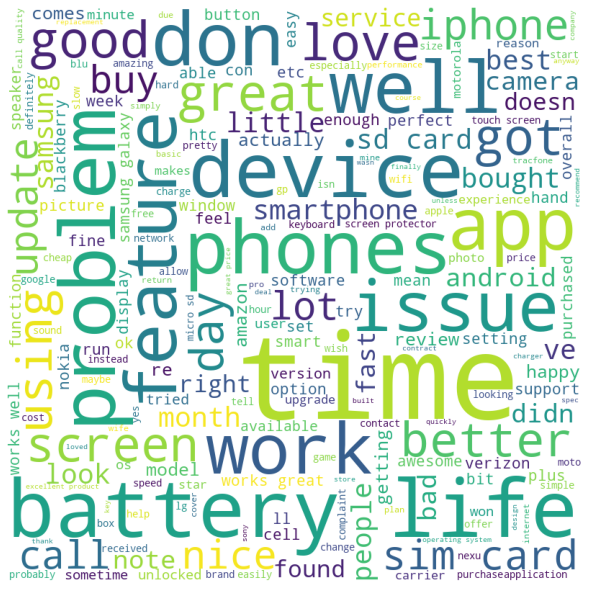

In [39]:
# Plotting wordCloud for features
wordcloud = WordCloud(width = 800, height = 800,
                background_color ='white',               
                min_font_size = 10).generate(features)

plt.figure(figsize = (8, 8), facecolor = None)
plt.imshow(wordcloud)
plt.axis("off")
plt.tight_layout(pad = 0)
 
plt.show()

# Building a sentiment classification engine

In [40]:
# Spliting the data into test and train
X_train,X_test,y_train,y_test = train_test_split(processed_Data.reviewText,processed_Data.review_sentiment,test_size=0.3)

In [41]:
# Creating the object of CountVectorizer
vec = CountVectorizer(stop_words=stop_words+['mobile','phone'])


In [42]:
# Fitting and transforming the training data
X_train_transform = vec.fit_transform(X_train)
X_train_transform

/usr/local/lib/python3.7/dist-packages/sklearn/feature_extraction/text.py:401: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['got'] not in stop_words.
  % sorted(inconsistent)


<44686x34614 sparse matrix of type '<class 'numpy.int64'>'
	with 1174086 stored elements in Compressed Sparse Row format>

In [43]:
# Creating object of MultinomialNB
mnb = MultinomialNB()


In [44]:
# Training model 
mnb.fit(X_train_transform,y_train)

MultinomialNB()

In [45]:
# Checking accureacy of the model
X_test_transform = vec.transform(X_test)
mnb.score(X_test_transform,y_test)

0.8613199665831245

In [46]:
# Testing model prediction on a sample text
mnb.predict(vec.transform(['battery of phone is good']))

array([1])

In [47]:
# Testing model prediction on a sample text
mnb.predict(vec.transform(['This phone is very heavy']))

array([1])

In [48]:
# Probability of testing data
y_pred_prob = mnb.predict_proba(X_test_transform)
y_pred_prob

array([[7.88540807e-01, 2.11459193e-01],
       [1.32274495e-01, 8.67725505e-01],
       [1.22401531e-01, 8.77598469e-01],
       ...,
       [2.10988299e-06, 9.99997890e-01],
       [5.30690976e-02, 9.46930902e-01],
       [7.08699427e-03, 9.92913006e-01]])

In [49]:
# Predicting the class of testing data
y_pred_class = mnb.predict(X_test_transform)
y_pred_class

array([0, 1, 1, ..., 1, 1, 1])

In [50]:
# Calculating confusion matrics
metrics.confusion_matrix(y_test,y_pred_class)

array([[ 2884,  1961],
       [  695, 13612]])

In [51]:
# Checking the model metrics
confusion = metrics.confusion_matrix(y_test,y_pred_class)
TN = confusion[0,0]
FP = confusion[0,1]
FN = confusion[1,0]
TP = confusion[1,1]

sensitivity = TP / float( FN + TP )
print('sensitivity= ',sensitivity)

specificity = TN / float(TN + FP )
print('specificity= ',specificity)

print(metrics.precision_score(y_test,y_pred_class))

print(metrics.f1_score(y_test,y_pred_class))

sensitivity=  0.9514223806528272
specificity=  0.5952528379772962
0.8740769280164387
0.9111111111111111


In [52]:
# Creating variables for ROC curve
false_positive, true_positive, thresholds = roc_curve(y_test,y_pred_prob[:,1])
roc_auc = auc(false_positive,true_positive)
print(roc_auc)

0.8979534868690646


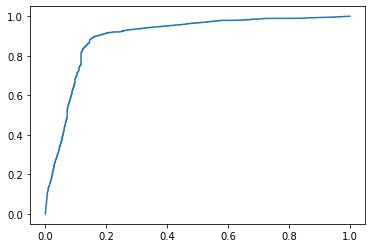

In [53]:
# Plotting ROC curve 
plt.plot(false_positive,true_positive)

# Compititor Analysis

In [54]:
# Replacing empty values with Nan
processed_Data['also_view'] = processed_Data.also_view.apply(lambda x : np.nan if len(x)==0 else x)

In [55]:
# Dropping the Nan values
processed_Data.dropna(inplace=True)

In [56]:
Top_10 = processed_Data[processed_Data.brand.isin((processed_Data.brand.value_counts() >= 4885).index[:10]) ] 
Top_10.head()

,overall,verified,asin,reviewerName,reviewText,review_sentiment,Date&Time,No_Stop_Words,category,also_buy,also_view,brand,Positive_Words,Negative_Words
85,1.0,True,B0009FCAJA,GC,The phone front screen stopped working and the...,0,2016-12-22,"[phone, front, screen, stopped, phone, didn, g...","[Cell Phones & Accessories, Cell Phones, Unloc...",[B000IN5ZHM],"[B003ZEU1MA, B0016JDBYG, B002UHS0UI, B005LRBF8...",Motorola,"[phone, front, screen, stopped, phone, didn, r...","[phone, front, screen, stopped, phone, didn, g..."
86,1.0,True,B0009FCAJA,Devon S.,Terrible it came with many scratches to the sc...,0,2016-11-11,"[terrible, scratches, screen, hour, using, scr...","[Cell Phones & Accessories, Cell Phones, Unloc...",[B000IN5ZHM],"[B003ZEU1MA, B0016JDBYG, B002UHS0UI, B005LRBF8...",Motorola,"[terrible, scratches, screen, hour, using, scr...","[screen, hour, using, screen, normally, don, t..."
87,5.0,True,B0009FCAJA,Roger Chavarria,I am very happy with this purchase,1,2016-06-12,"[am, happy, purchase]","[Cell Phones & Accessories, Cell Phones, Unloc...",[B000IN5ZHM],"[B003ZEU1MA, B0016JDBYG, B002UHS0UI, B005LRBF8...",Motorola,"[am, purchase]","[am, happy, purchase]"
88,5.0,True,B0009FCAJA,Carl Mckoy,Use them until AT&T dropped service.,0,2015-11-03,"[dropped, service]","[Cell Phones & Accessories, Cell Phones, Unloc...",[B000IN5ZHM],"[B003ZEU1MA, B0016JDBYG, B002UHS0UI, B005LRBF8...",Motorola,"[dropped, service]","[dropped, service]"
89,5.0,True,B0009FCAJA,Fedeve,worked very well,0,2015-09-09,"[worked, well]","[Cell Phones & Accessories, Cell Phones, Unloc...",[B000IN5ZHM],"[B003ZEU1MA, B0016JDBYG, B002UHS0UI, B005LRBF8...",Motorola,[],"[worked, well]"


In [57]:
# Creating mapping for brand name and asin's
brands_asin = {}

for i in processed_Data.brand.unique():
  asins = set(processed_Data[processed_Data["brand"] == i].asin.to_list())
  for j in asins:
    brands_asin[j] = i
brands_asin

{'B01HDIRLC6': '',
 'B00063DKVC': '',
 'B00PZPYN0S': '',
 'B00P0FEEKC': '',
 'B010GIVERI': '',
 'B0006FLA80': 'Palm Treo 650',
 'B006FXY9LC': 'Motorola',
 'B000E95OAI': 'Motorola',
 'B000A1329U': 'Motorola',
 'B017HW9DEW': 'Motorola',
 'B006GQWTZQ': 'Motorola',
 'B008P5A5SO': 'Motorola',
 'B00SIE2YQ8': 'Motorola',
 'B00E92B88I': 'Motorola',
 'B015ROR4PC': 'Motorola',
 'B0016JDBYG': 'Motorola',
 'B008X5YUGO': 'Motorola',
 'B01BGEZVXO': 'Motorola',
 'B0016JB8K0': 'Motorola',
 'B003DQD5CS': 'Motorola',
 'B00EP2BYHW': 'Motorola',
 'B00GWR373M': 'Motorola',
 'B000G7LZCO': 'Motorola',
 'B001PO8MM8': 'Motorola',
 'B005MERUHA': 'Motorola',
 'B00IK5PJV2': 'Motorola',
 'B006Z37ZOU': 'Motorola',
 'B0052TQ4FY': 'Motorola',
 'B01EZC9WC0': 'Motorola',
 'B01DZJFYGM': 'Motorola',
 'B00ISEC5CG': 'Motorola',
 'B00MWI4LD0': 'Motorola',
 'B00XQVDW6Y': 'Motorola',
 'B006GHX5ZS': 'Motorola',
 'B00XZA5F3O': 'Motorola',
 'B004FOVZ1A': 'Motorola',
 'B0013A7KMW': 'Motorola',
 'B00HE5834Y': 'Motorola',
 'B007LA4

In [58]:
# Creating mapping for brand and it's top compititor
all_data = {}
for k in Top_10.brand.unique():
  comp = {}
  for i in Top_10[Top_10.brand == k].also_view:
    for j in i:
      if j in brands_asin:
        brand = brands_asin[j]
        if brand == k:
          continue
      else:
        continue      
      if brand in comp:     
        comp[brand] = comp[brand]+1
      else:
        comp[brand]=1
  compititor = sorted(comp.items(), key=lambda x : x[1], reverse=True)[0]
  name = compititor[0]
  count = compititor[1]

  all_data[k] = [name,count]

In [59]:
# Converting mapping to DataFrame
compititor = pd.DataFrame(all_data).T
compititor.head()

,0,1
Motorola,Samsung,2516
LG,Samsung,5757
BlackBerry,LG,1588
Nokia,BlackBerry,2069
Samsung,LG,5902


In [60]:
# Renaming columns
compititor.index.name = 'company'
compititor.rename(columns={0:'Compititor',1:'count'},inplace=True)

In [61]:
# Creating the new column
compititor['text'] = compititor.apply(lambda x: f'{x["Compititor"]} ({x["count"]})',axis=1)

In [62]:
# Plotting data
fig = px.line(compititor,x=compititor.index,y='count',text='text')
fig.update_traces(textposition='top center')
